# Choropleth Map

Um mapa de atributos (*choropleth map*) é um mapa temático no qual um conjunto de áreas pré-definidas é colorido ou padronizado em proporção a uma variável estatística que representa uma característica geográfica dentro de cada área.

## Componentes

Para construir um *choropleth map* existem dois insumos obrigatórios: um arquivo que contém a delimitação das áreas (ex: GeoJSON) e um conjunto de dados com as informações que deseja exibir na forma de cores no mapa.

### Contorno das áreas

GeoJSON é um formato para codificar uma variedade de estrutura de dados geográficos. Exemplo:

>```
{
  "type": "Feature",
  "geometry": {
    "type": "Point",
    "coordinates": [125.6, 10.1]
  },
  "properties": {
    "name": "Dinagat Islands"
  }
}
```

GeoJSON suporta os seguintes tipos de geometria: *Point*, *LineString*, *Polygon*, *MultiPoint*, *MultiLineString* e *MultiPolygon*. Objetos geométricos com propriedades adicionais são objetos do tipo *Feature*. Um conjunto de *Features* formam objetos do tipo *FeatureCollection*.

### Variável Estatística

Aqui não há mistério. Se você quiser inserir dados em um mapa, primeiro terá que obter esses dados. Exemplos de características geográficas que uma variável estatística pode representar: densidade populacional, renda per capita, etc.

## Implementação com a biblioteca Folium

In [2]:
import requests
import pandas as pd
import folium

In [3]:
#Insumo 1: GeoJSON dos estados brasileiros
#Recuperando o GeoJSON a partir da url abaixo através do método (http) get 
response = requests.get(url = 'https://raw.githubusercontent.com/fititnt/gis-dataset-brasil/master/uf/geojson/uf.json')
if response.status_code == 200: # O código 200 (OK) indica que a solicitação foi bem sucedida
    state_geo = response.json()

type(state_geo) # O arquivo GeoJSON é transformado em um dicionário após a aplicação do método .json()

dict

In [4]:
#Insumo 2: População dos estados brasileiros
#O dado de população absoluta por estado está no data.csv
state_data = pd.read_csv('data.csv', encoding='latin-1')
state_data

,UFs,Códigos,População
0,Acre,12,803513
1,Alagoas,27,3340932
2,Amapá,16,766679
3,Amazonas,13,3938336
4,Bahia,29,15203934
5,Ceará,23,8904459
6,Distrito Federal,53,2914830
7,Espírito Santo,32,3929911
8,Goiás,52,6610681
9,Maranhão,21,6904241


O Código dos estados e municípios brasileiros pode ser consultado em https://www.ibge.gov.br/explica/codigos-dos-municipios.php


In [5]:
#Criação do mapa centralizado no Brasil (14.2350° S, 51.9253° W)
map = folium.Map(
    location=[-14.2350,-51.9253],
    tiles='cartodbpositron', #Outras opções: 'Stamen Terrain' (vegetação) e 'Stamen Toner' (rio, lagos e mares)
    zoom_start=4,
)

#Exibição do mapa
map

In [6]:
#Criação do mapa centralizado no Brasil (14.2350° S, 51.9253° W)
#Documentação Folium: https://python-visualization.github.io/folium/modules.html
map = folium.Map(
    location=[-14.2350,-51.9253],
    tiles='cartodbpositron', #Outras opções: 'Stamen Terrain' (vegetação) e 'Stamen Toner' (rio, lagos e mares)
    zoom_start=4,
)

#Colorindo o mapa
folium.Choropleth(
    geo_data=state_geo, #contorno dos estados
    data=state_data, #dados de população
    columns=['Códigos', 'População'], #colunas do dataframe state_data com o código e a população de cada estado
    key_on='feature.properties.GEOCODIGO', #propriedade do state_geo que contém o código de cada estado
    fill_color='BuGn', #‘BuGn’, ‘BuPu’, ‘GnBu’, ‘OrRd’, ‘PuBu’, ‘PuBuGn’, ‘PuRd’, ‘RdPu’, ‘YlGn’, ‘YlGnBu’, ‘YlOrBr’, and ‘YlOrRd’.
    fill_opacity=0.7, #opacidade do preenchimento (cor) de cada estado
    line_opacity=0.5, #opacidade da linha que define cada estado
    line_color='black', #cor da linha que define cada estado
    #highlight=True, #destaca o estado ao passar com o mouse em cima dele
    legend_name='Population', #nome da legenda
).add_to(map)

#Exibição do mapa
map

Por que no mapa acima os estados não foram pintados? De alguma forma o *Folium* não consegui fazer o elo do código de cada estado na variável de contorno (`state_geo`) e de população (`state_data`). O que pode ter acontecido?

In [7]:
print(type(state_geo['features'][0]['properties']['GEOCODIGO']))
print(type(state_data['Códigos'][0]))

<class 'str'>
<class 'numpy.int64'>


Perceba que o código de estado em ambos os *datasets* não possuem o mesmo tipo. No *dataset* de contorno (`state_geo`) o código do estado (`GEOCODIGO`) é do tipo string (str); já no *dataset* que contém os dados de população absoluta (`state_data`) o código do estado (`Códigos`) é do tipo inteiro (int).

Para resolvemos esse problema temos que modificar o tipo de uma delas para que ambas representem string ou inteiro. Assim o *Folium* consegue fazer a ponte (*match*) entre o dado de contorno (que está em `state_geo`) e o dado de população (que está em `state_data`) de um determinado estado brasileiro.

In [8]:
#Corrigindo as referência dos códigos dos estados
state_data['Códigos'] = state_data['Códigos'].astype(str) #transformando a coluna 'Códigos' de inteiro para string

E finalmente temos o *choropleth map* da população absoluta por estado no Brazil:

In [9]:
#Criação do mapa centralizado no Brasil (14.2350° S, 51.9253° W)
map = folium.Map(
    location=[-14.2350,-51.9253],
    tiles='cartodbpositron', #cartodbpositron, Stamen Terrain, Stamen Toner
    zoom_start=4,
)

#Colorindo o mapa
folium.Choropleth(
    geo_data=state_geo,
    data=state_data,
    columns=['Códigos', 'População'],
    key_on='feature.properties.GEOCODIGO',
    fill_color='OrRd', #‘BuGn’, ‘BuPu’, ‘GnBu’, ‘OrRd’, ‘PuBu’, ‘PuBuGn’, ‘PuRd’, ‘RdPu’, ‘YlGn’, ‘YlGnBu’, ‘YlOrBr’, and ‘YlOrRd’.
    fill_opacity=0.7,
    line_opacity=0.5,
    line_color='black',
    highlight=True,
    legend_name='Population',
).add_to(map)

#Exibição do mapa
map

## Implementação com a biblioteca Plotly

In [10]:
import plotly.express as px

A implementação com a biblioteca *Plotly* é direta uma vez que entendemos como o *Folium* funciona. As informações que passamos em forma de parâmetros é a mesma, só que num formato diferente. Compare os métodos `px.choropleth` baixo com o `folium.choropleth` do item anterior.

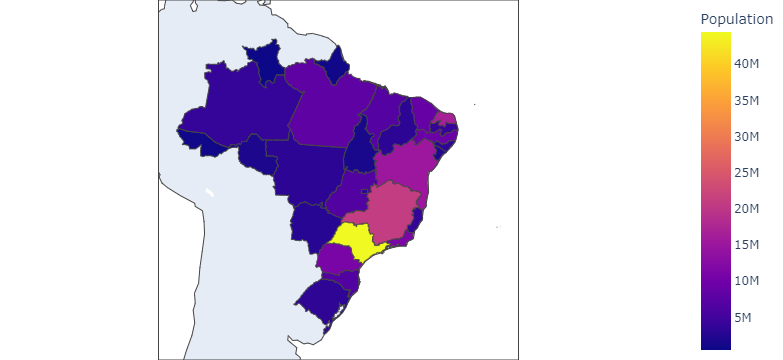

In [11]:
#Criando o mapa e colorindo
#Documentação Plotly: https://plotly.com/python/choropleth-maps/
fig = px.choropleth(state_data, geojson=state_geo, color="População",
                    locations="Códigos", featureidkey="properties.GEOCODIGO",
                    projection="mercator",
                    labels={'População':'Population'},
                   )
fig.update_geos(fitbounds="geojson", visible=True)
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

# Autor

<a href="https://www.youtube.com/channel/UCa-d0hwYHOu6ehwc_oMjOoA" target="_blank">Alcides Lino (canal Programação e Liberdade)</a>

---

# Registro de Alterações (*Change Log*)

| Data (DD/MM/YYYY) | Versão  | Alterado Por | Descrição da Mudança                |
| ----------------- | ------- | ------------ | ----------------------------------- |
| 06/03/2022        | 1.0     | Alcides      | Versão inicial                      |